In [1]:
import os
import argparse
import tensorflow as tf
from src.dataset import DatasetCreator
from src.ddim import DDIM

2023-09-21 22:26:52.419993: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-21 22:26:53.818937: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
parser = argparse.ArgumentParser()
# Mode to run code
parser.add_argument("--mode", default=None, type=str, choices=["train", "upscale"],
                    help="Mode of using the model")
# Arguments for training
parser.add_argument("--seed", default=42, type=int, help="Random seed")
parser.add_argument("--height", default=128, type=int, help="Up-scaled image height")
parser.add_argument("--width", default=128, type=int, help="Up-scaled image width")
parser.add_argument("--channels", default=3, type=int, help="Up-scaled image channels")
parser.add_argument("--cnn_channels", default=32, type=int, help="CNN channels in the first stage")
parser.add_argument("--downscale", default=4, type=int, help="Downscale factor")
parser.add_argument("--stages", default=4, type=int, help="UNet scaling stages")
parser.add_argument("--stage_blocks", default=2, type=int, help="ResNet blocks per stage")
parser.add_argument("--ema", default=0.999, type=float, help="Exponential moving average momentum")
parser.add_argument("--batch_size", default=64, type=int, help="Size of batch of the train set")
parser.add_argument("--epoch_batches", default=1000, type=int, help="Number of images per one epoch")
parser.add_argument("--epochs", default=100, type=int, help="Number of epochs")
parser.add_argument("--test_size", default=100, type=int, help="Number of the images in the test set")
parser.add_argument("--log_folder", default="training_4x_to_128", type=str, help="Folder to save weights")
parser.add_argument("--dataset_folder", default="/projects/SkyGAN/clouds_fisheye/processed", type=str,
                    help="Folder with training data")
# Arguments for upscaling
parser.add_argument("--src_folder", default="images32", type=str, help="Folder with images to upscale")
parser.add_argument("--dst_folder", default="sr_images128", type=str, help="Folder to save results")
parser.add_argument("--upscale", default=4, type=int, choices=[4, 8], help="Upscale factor")
parser.add_argument("--weights_path", default="/home/s_gladkykh/training_4x_to_128/cp.ckpt", type=str,
                    choices=[4, 8], help="Upscale factor")
parser.add_argument("--resolution", default=(32, 32), type=tuple, choices=[(32, 32)],
                    help="Starting resolution of the images to upscale")
args = parser.parse_args([] if "__file__" not in globals() else None)

In [3]:
low_res = []
high_res = []
for filename in os.listdir(args.src_folder):
    if filename.endswith('.jpg'):
        image = tf.io.read_file(os.path.join(args.src_folder, filename))
        image = tf.image.decode_image(image, channels=3)
        image = tf.image.resize(image, args.resolution)
        low_res.append(image)
        image = tf.io.read_file(os.path.join(f"images{args.height}", filename))
        image = tf.image.decode_image(image, channels=3)
        image = tf.image.resize(image, (args.height, args.width))
        high_res.append(image)
stacked_low_res = tf.stack(low_res)
stacked_high_res = tf.stack(high_res)

2023-09-21 22:26:57.489732: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1639] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 46702 MB memory:  -> device: 0, name: NVIDIA RTX A6000, pci bus id: 0000:81:00.0, compute capability: 8.6
2023-09-21 22:26:57.490726: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1639] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 10082 MB memory:  -> device: 1, name: NVIDIA GeForce RTX 3080 Ti, pci bus id: 0000:03:00.0, compute capability: 8.6


In [4]:
ddim = DDIM(args, stacked_high_res)

In [5]:
ddim.load_weights(args.weights_path)

In [6]:
noise = tf.random.normal(
    [stacked_high_res.shape[0], args.resolution[0] * args.upscale, args.resolution[1] * args.upscale, 3],
    seed=args.seed
)

In [7]:
results = ddim.generate(noise, stacked_low_res, 1000)

2023-09-21 22:27:04.410936: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:432] Loaded cuDNN version 8600
2023-09-21 22:27:05.234167: I tensorflow/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2023-09-21 22:27:05.536001: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:606] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


In [8]:
psnr = tf.image.psnr(
    tf.cast(results, tf.uint8), tf.cast(stacked_high_res, tf.uint8), max_val=255
)
psnr

<tf.Tensor: shape=(110,), dtype=float32, numpy=
array([30.649645, 23.83925 , 25.816244, 30.055113, 25.767057, 29.467796,
       29.988707, 25.593441, 30.33769 , 25.250175, 24.957172, 25.7892  ,
       28.888317, 29.872395, 30.458311, 24.439308, 24.774443, 30.081247,
       30.507044, 24.48751 , 29.001564, 24.47482 , 32.16904 , 23.572514,
       29.22301 , 30.19339 , 31.738144, 24.635237, 28.884146, 25.147139,
       30.338821, 24.756916, 24.88126 , 30.06779 , 31.810408, 25.799313,
       25.006044, 23.753168, 31.732525, 29.86707 , 29.56256 , 25.07201 ,
       29.243996, 25.788404, 29.050522, 25.58973 , 30.06611 , 24.660028,
       30.500324, 29.564245, 30.755154, 29.447758, 25.088274, 30.049404,
       25.765715, 30.473145, 25.762297, 25.191162, 31.756147, 25.243317,
       29.355516, 32.77904 , 30.585829, 32.31422 , 25.665094, 29.926231,
       29.39135 , 25.5323  , 29.572458, 30.753159, 29.4954  , 24.401104,
       30.129833, 30.528322, 23.693865, 30.430006, 24.514353, 24.417665,
   

In [9]:
tf.reduce_mean(psnr)

<tf.Tensor: shape=(), dtype=float32, numpy=27.862164>

In [10]:
ssim = tf.image.ssim(
    tf.cast(results, tf.uint8), tf.cast(stacked_high_res, tf.uint8), max_val=255
)
ssim

<tf.Tensor: shape=(110,), dtype=float32, numpy=
array([0.83176845, 0.76204675, 0.77284735, 0.8266897 , 0.76553303,
       0.79644156, 0.8250363 , 0.75346595, 0.8388775 , 0.72840804,
       0.7133341 , 0.76789206, 0.7927839 , 0.82510453, 0.8205242 ,
       0.756835  , 0.7176962 , 0.82177186, 0.8396831 , 0.69460946,
       0.78879815, 0.6945846 , 0.8772786 , 0.7538891 , 0.79659706,
       0.8209353 , 0.8687844 , 0.7490046 , 0.78924894, 0.7282899 ,
       0.83075255, 0.75087017, 0.7711261 , 0.81431156, 0.869646  ,
       0.7658747 , 0.7697297 , 0.75447494, 0.8660535 , 0.80244714,
       0.7938203 , 0.7815415 , 0.80030173, 0.7628167 , 0.8015508 ,
       0.74435836, 0.8045268 , 0.69908065, 0.8333819 , 0.8204554 ,
       0.84115523, 0.7975169 , 0.7644945 , 0.8170392 , 0.761553  ,
       0.8311436 , 0.7572334 , 0.7169061 , 0.86773485, 0.71999717,
       0.8060357 , 0.89424497, 0.8435944 , 0.8788349 , 0.75471115,
       0.810174  , 0.8006701 , 0.72564286, 0.81256205, 0.8390629 ,
       0.79915

In [11]:
tf.reduce_mean(ssim)

<tf.Tensor: shape=(), dtype=float32, numpy=0.78817946>

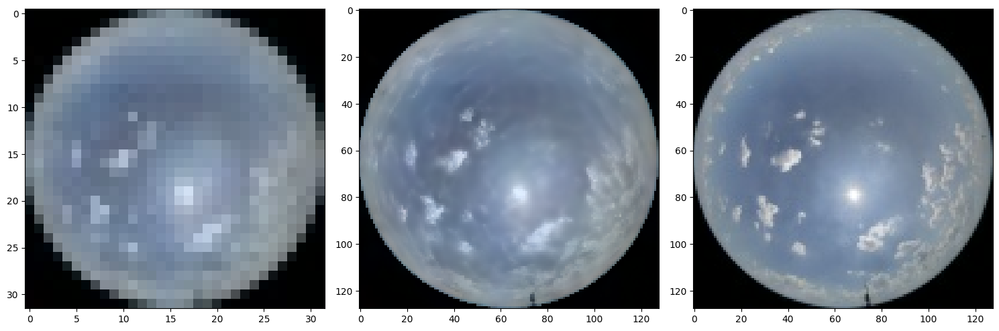

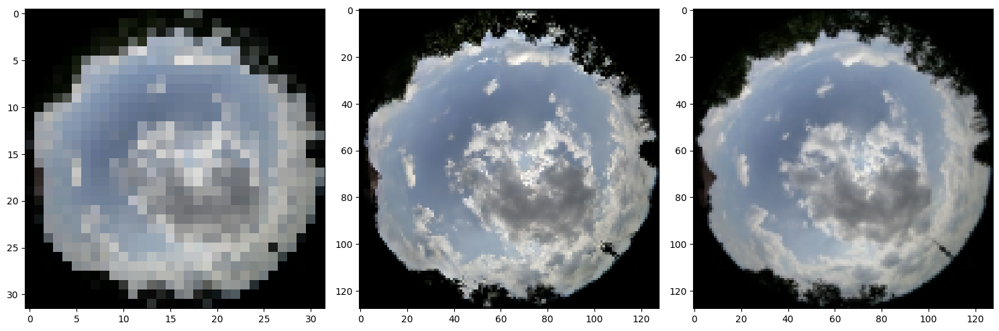

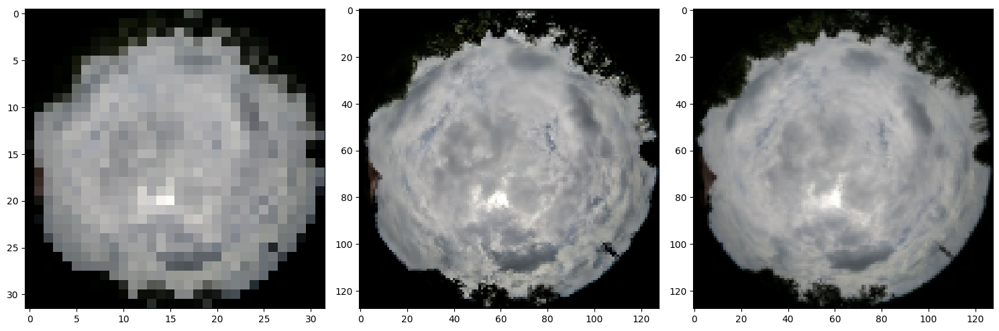

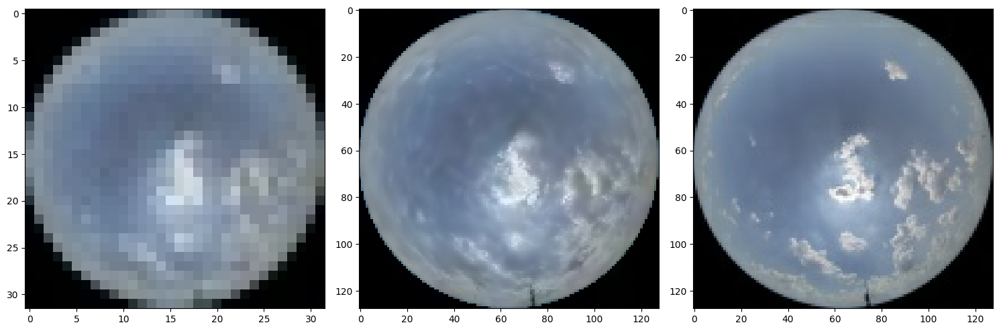

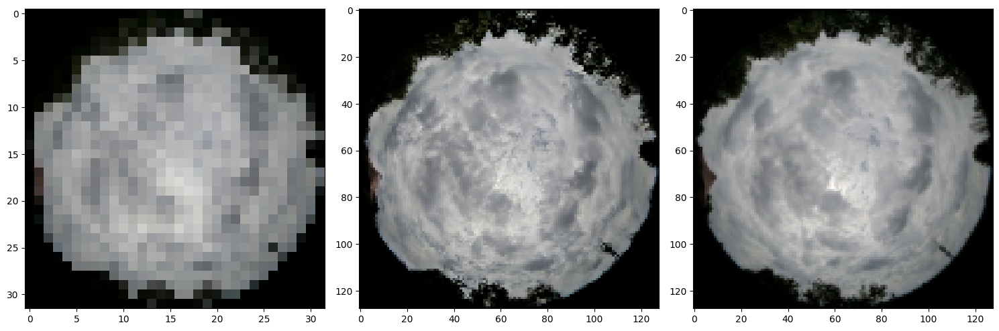

...

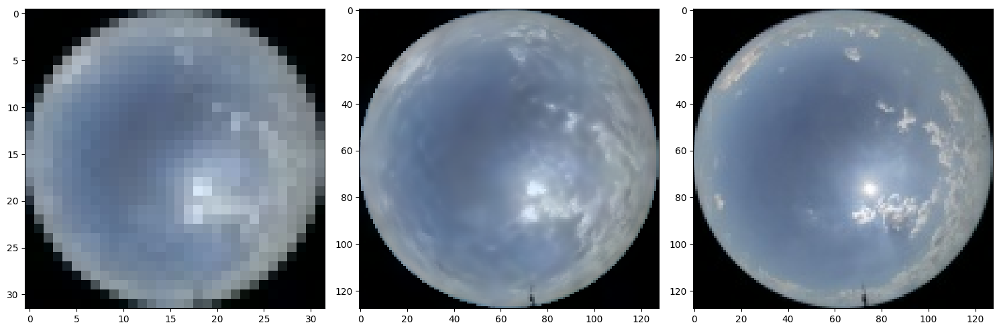

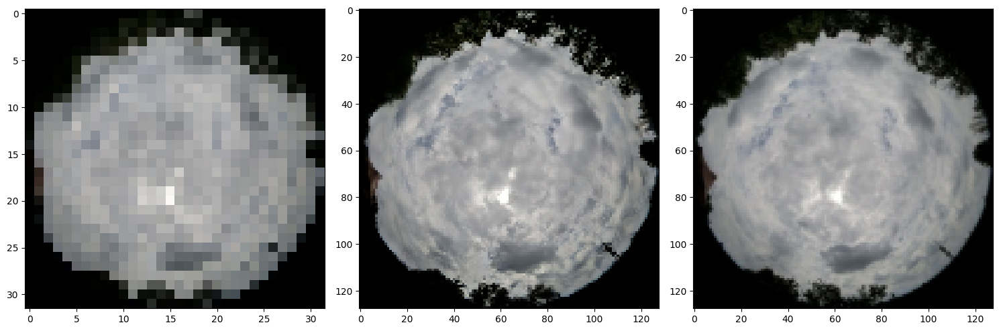

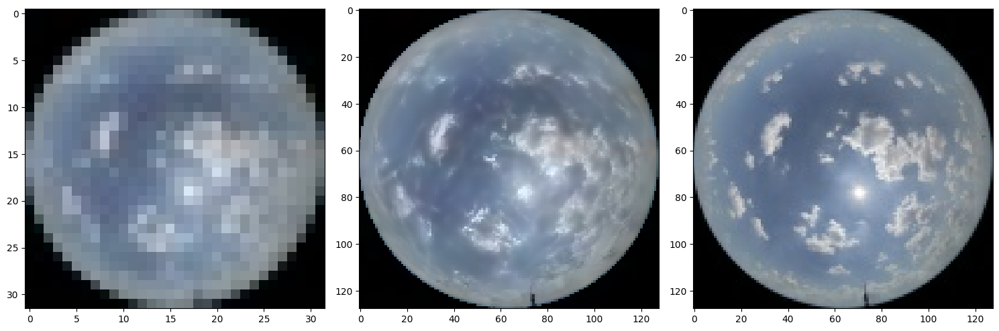

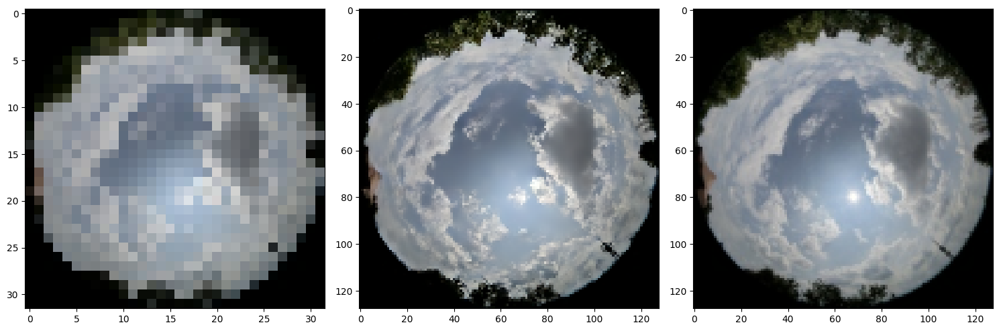

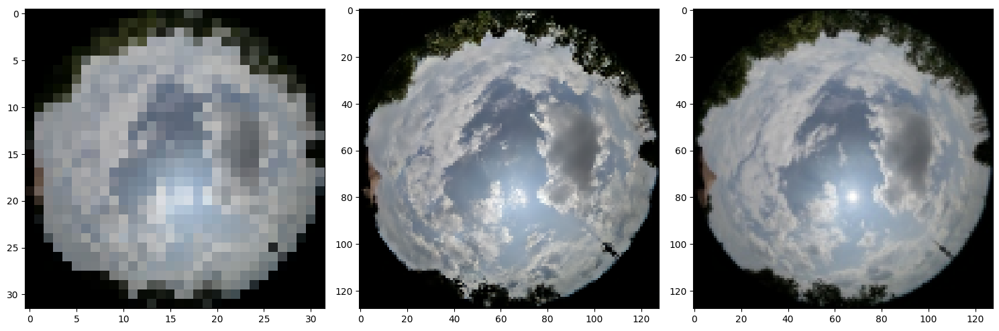

In [12]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

for i in range(results.shape[0]):
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    image1 = tf.cast(stacked_low_res[i], tf.uint8)
    image2 = tf.cast(results[i], tf.uint8)
    image3 = tf.cast(stacked_high_res[i], tf.uint8)
    axes[0].imshow(image1)
    axes[1].imshow(image2)
    axes[2].imshow(image3)
    plt.tight_layout()
    plt.show()